<a href="https://colab.research.google.com/github/StevenJourney/Computer_Vision/blob/main/Face_Detection_CV2_Haarcascade_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lode the image

In [2]:
import cv2

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Cascades/haarcascade_frontalface_default.xml')

### Detecting faces (params: scaleFactor, minNeighbors, minSize, maxSize)

43 43
41 41
45 45
45 45
43 43
47 47
38 38
53 53
50 50
52 52
50 50
52 52
60 60
53 53
51 51


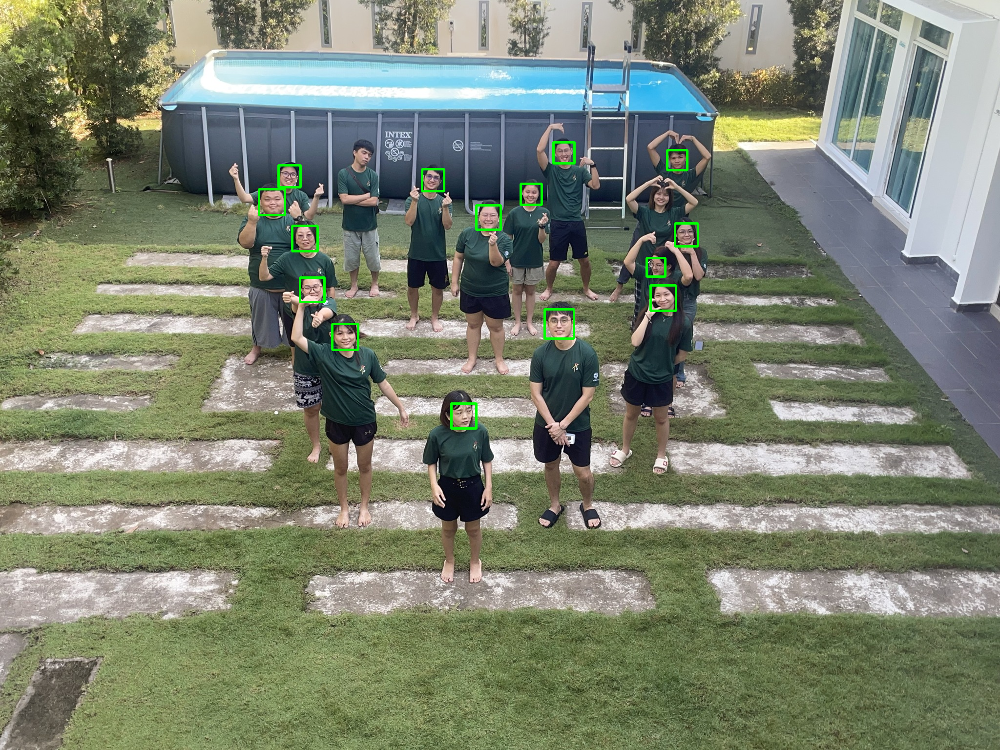

In [5]:
from google.colab.patches import cv2_imshow

image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Images/youth.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.21, minNeighbors=3,
                                            minSize=(20,20), maxSize=(100,100))
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 3)
cv2_imshow(image)

In [6]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #change the image from RGB to GRAY

### Detecting Car

In [7]:
car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Cascades/cars.xml')

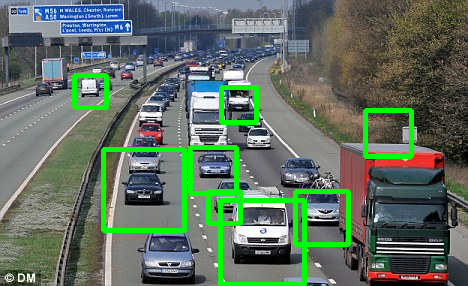

In [8]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Images/car.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = car_detector.detectMultiScale(image_gray, scaleFactor=1.03, minNeighbors=5)

for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (0,255,0), 3)
cv2_imshow(image)

### Detecting a clock

In [9]:
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Cascades/clocks.xml')

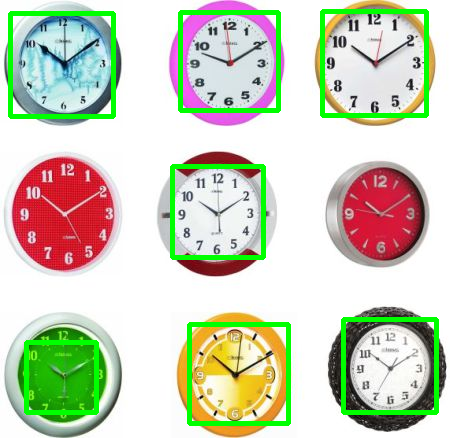

In [10]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Images/clock.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = clock_detector.detectMultiScale(image_gray, scaleFactor=1.03, minNeighbors=1)

for x,y,w,h in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (0,255,0), 3)
cv2_imshow(image)

176 352
189 377
303 607
206 412
263 526
227 453


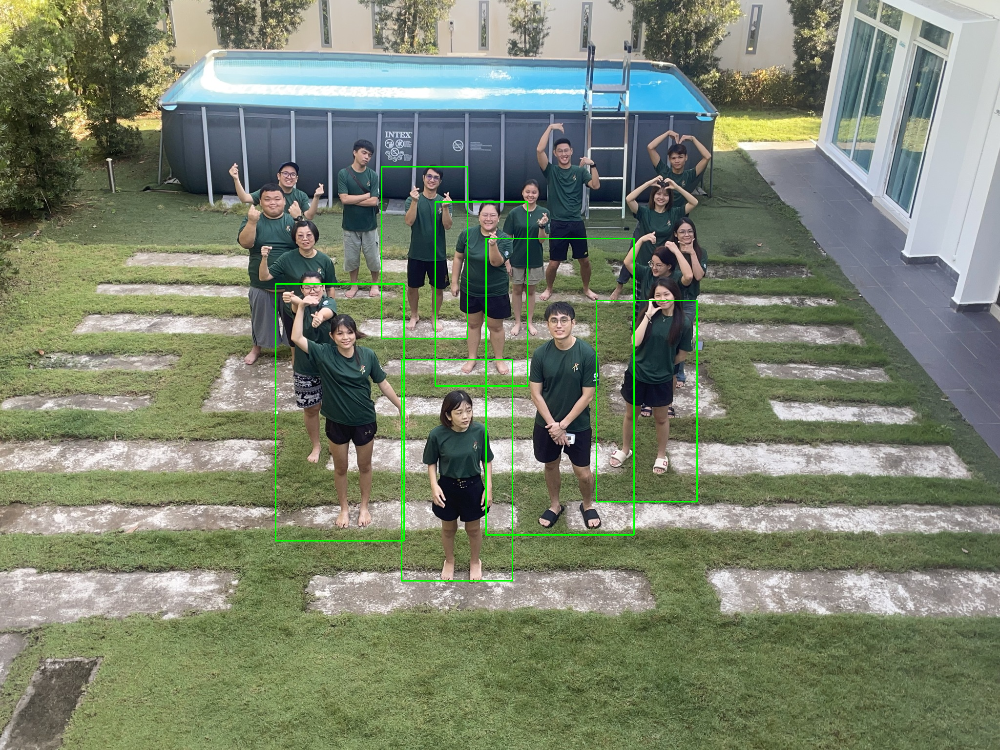

In [11]:
full_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Cascades/fullbody.xml')
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Images/youth.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = full_detector.detectMultiScale(image_gray, scaleFactor = 1.01, minNeighbors=4,minSize=(100,100))

for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

## Detecting faces with HOG

In [12]:
import dlib

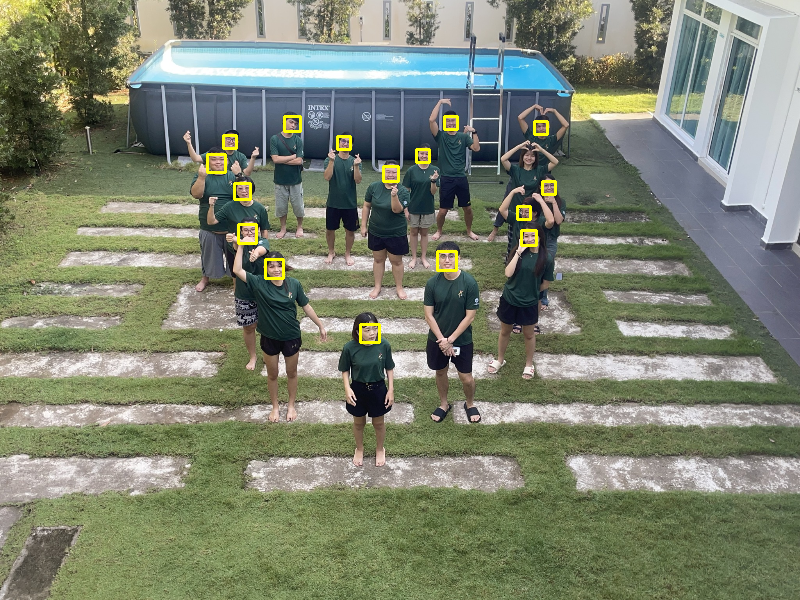

In [13]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Images/youth.jpg')
image = cv2.resize(image,(800,600))
face_detector_hog = dlib.get_frontal_face_detector()
detections = face_detector_hog(image, 1)

for face in detections:
  #print(face)
  #print(face.left())
  #print(face.top())
  #print(face.right())
  #print(face.bottom())
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)
cv2_imshow(image)

## Detecting faces with CNN (Convolutional Neural Networks)

In [14]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Images/people2.jpg')
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass (1)/Weights/mmod_human_face_detector.dat')

1.1440608501434326
1.1370506286621094
1.127898931503296
1.1200274229049683
1.1149379014968872
1.1131560802459717
1.0975687503814697
1.0942119359970093
1.0853146314620972
1.0801897048950195
1.0800751447677612
1.0784766674041748
1.0664023160934448
1.06417977809906


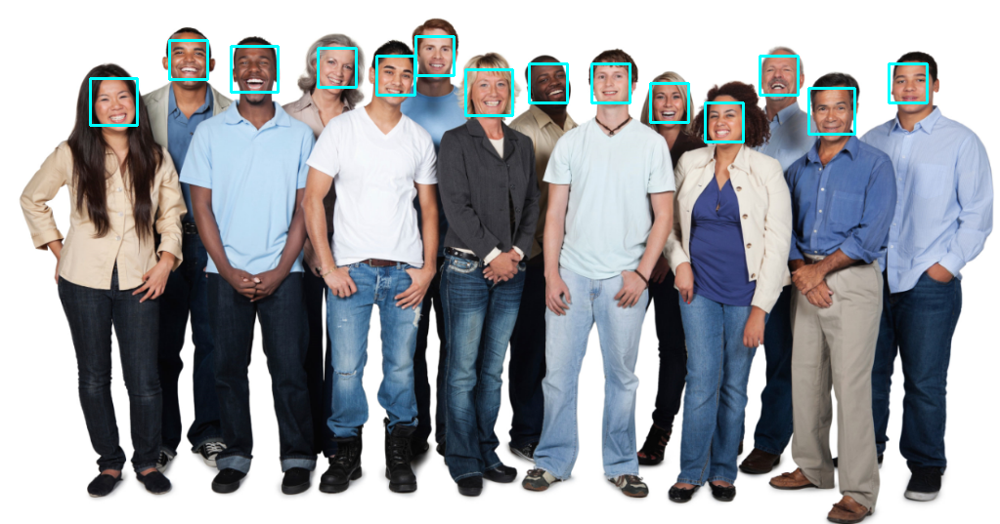

In [15]:
detections = cnn_detector(image, 1)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image, (l, t), (r, b), (255, 255, 0), 2)
cv2_imshow(image)